<a href="https://colab.research.google.com/github/ossnat/VSD_foundation_model/blob/main/Fast_VideoMAE_2D_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# VidoeMAE 2D CNN Training Notebook

This notebook trains a 2D MAE model using the latest dataset strucure:
- Build a 2D MAE (shallow CNN encoder + lightweight decoder)
- Train and log metrics to TensorBoard



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir -p /content/Data/FoundationData/ProcessedData
!cp -r '/content/drive/My Drive/Gonda_research_Hamutal_2024/Ossnat/VSD_FM/Data/FoundationData/ProcessedData/frodo' /content/Data/FoundationData/ProcessedData
!cp -r '/content/drive/My Drive/Gonda_research_Hamutal_2024/Ossnat/VSD_FM/Data/FoundationData/ProcessedData/splits' /content/Data/FoundationData/ProcessedData

cp: cannot open '/content/drive/My Drive/Gonda_research_Hamutal_2024/Ossnat/VSD_FM/Data/FoundationData/ProcessedData/splits/split_v1_seed17_strat_monkey.gsheet' for reading: Operation not supported


In [ ]:
!rm -rf VSD_foundation_model
!git clone https://github.com/ossnat/VSD_foundation_model.git

Cloning into 'VSD_foundation_model'...
remote: Enumerating objects: 778, done.
remote: Counting objects: 100% (183/183), done.
remote: Compressing objects: 100% (121/121), done.
remote: Total 778 (delta 104), reused 81 (delta 59), pack-reused 595 (from 2)
Receiving objects: 100% (778/778), 14.90 MiB | 16.68 MiB/s, done.
Resolving deltas: 100% (447/447), done.


In [ ]:
# Imports and configuration
import os
import sys
import yaml
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
from pathlib import Path

project_root = Path('VSD_foundation_model')
sys.path.insert(0, str(project_root))

from src.data import load_dataset, create_dataset, VsdVideoDataset
from src.models.heads.mae_decoder_2d import MAEDecoder2D
from src.models.systems.mae_system import MAESystem
from src.utils.logger import TBLogger, set_seed
from src.training.trainer import Trainer

# Shallow CNN backbone with ResNet18-like output size
class MAEShallowCNNBackbone(nn.Module):
    def __init__(self, in_channels: int = 1):
        super().__init__()
        self.feature_dim = 512
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.encoder(x)


In [ ]:
# Load config
config_path = "VSD_foundation_model/configs/data_configs/MAE_2D_data.yaml"
with open(config_path, 'r') as f:
  cfg = yaml.safe_load(f)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\nUsing device: {device}")


Using device: cuda


In [ ]:
cfg['monkeys'] = ['frodo']
cfg['mask_ratio'] = 0.5
cfg

{'dataset_name': 'vsd_mae',
 'split_csv_path': 'Data/FoundationData/ProcessedData/splits/split_v1_seed17_strat_monkey.csv',
 'stats_json_path': 'Data/FoundationData/ProcessedData/splits/baseline_stats_v1_seed17_strat_monkey.json',
 'processed_root': 'Data/FoundationData/ProcessedData/splits',
 'frame_start': 30,
 'frame_end': 100,
 'clip_length': 1,
 'mask_ratio': 0.5,
 'patch_size': [1, 8, 8],
 'crop_frame': None,
 'crop_radius': None,
 'batch_size': 256,
 'num_workers': 4,
 'pin_memory': True,
 'persistent_workers': True,
 'prefetch_factor': 2,
 'monkeys': ['frodo']}

In [ ]:
batch_size=512
# cfg['monkeys'] = 'frodo'
train_loader = load_dataset(cfg, split="train", batch_size=batch_size, num_workers=4, shuffle=False)

[data_loader] monkeys from config (cfg.get('monkeys')): ['frodo']
[data_loader] monkeys passed to dataset (after dropping None): ['frodo']
[dataset] monkeys filter received: ['frodo'] (None = use all monkeys)
Loading split CSV from Data/FoundationData/ProcessedData/splits/split_v1_seed17_strat_monkey.csv...
Successfully read CSV with standard settings
Found CSV columns (10 total): ['trial_global_id', 'monkey', 'date', 'condition', 'source_file', 'target_file', 'trial_index_in_condition', 'shape', 'trial_dataset', 'split']
CSV shape: (5706, 10) (rows x columns)
Required columns found: ['target_file', 'trial_dataset', 'shape', 'split'] out of ['target_file', 'trial_dataset', 'shape', 'split']
Sample first row (showing required columns):
  target_file: Data/FoundationData/ProcessedData/boromir/session_220622d_condsAN.h5
  trial_dataset: trial_000008
  shape: (10000, 256)
  split: train
Filtered trials by monkeys ['frodo']: 3994 -> 801
Found 801 trials for split 'train'
Loading stats from 

Preloading trials into CPU RAM: 100%|██████████| 801/801 [01:02<00:00, 12.74trial/s]

Preloaded 801 trials into CPU RAM.


In [ ]:
val_loader = load_dataset(cfg, split="val", batch_size=batch_size, num_workers=0, shuffle=False)

[data_loader] monkeys from config (cfg.get('monkeys')): ['frodo']
[data_loader] monkeys passed to dataset (after dropping None): ['frodo']
[dataset] monkeys filter received: ['frodo'] (None = use all monkeys)
Loading split CSV from Data/FoundationData/ProcessedData/splits/split_v1_seed17_strat_monkey.csv...
Successfully read CSV with standard settings
Found CSV columns (10 total): ['trial_global_id', 'monkey', 'date', 'condition', 'source_file', 'target_file', 'trial_index_in_condition', 'shape', 'trial_dataset', 'split']
CSV shape: (5706, 10) (rows x columns)
Required columns found: ['target_file', 'trial_dataset', 'shape', 'split'] out of ['target_file', 'trial_dataset', 'shape', 'split']
Sample first row (showing required columns):
  target_file: Data/FoundationData/ProcessedData/boromir/session_220622d_condsAN.h5
  trial_dataset: trial_000008
  shape: (10000, 256)
  split: train
Filtered trials by monkeys ['frodo']: 856 -> 171
Found 171 trials for split 'val'
Loading stats from Dat

Preloading trials into CPU RAM: 100%|██████████| 171/171 [00:12<00:00, 13.78trial/s]

Preloaded 171 trials into CPU RAM.


In [ ]:
test_loader = load_dataset(cfg, split="test", batch_size=batch_size, num_workers=0, shuffle=False)

[data_loader] monkeys from config (cfg.get('monkeys')): ['frodo']
[data_loader] monkeys passed to dataset (after dropping None): ['frodo']
[dataset] monkeys filter received: ['frodo'] (None = use all monkeys)
Loading split CSV from Data/FoundationData/ProcessedData/splits/split_v1_seed17_strat_monkey.csv...
Successfully read CSV with standard settings
Found CSV columns (10 total): ['trial_global_id', 'monkey', 'date', 'condition', 'source_file', 'target_file', 'trial_index_in_condition', 'shape', 'trial_dataset', 'split']
CSV shape: (5706, 10) (rows x columns)
Required columns found: ['target_file', 'trial_dataset', 'shape', 'split'] out of ['target_file', 'trial_dataset', 'shape', 'split']
Sample first row (showing required columns):
  target_file: Data/FoundationData/ProcessedData/boromir/session_220622d_condsAN.h5
  trial_dataset: trial_000008
  shape: (10000, 256)
  split: train
Filtered trials by monkeys ['frodo']: 856 -> 172
Found 172 trials for split 'test'
Loading stats from Da

Preloading trials into CPU RAM: 100%|██████████| 172/172 [00:12<00:00, 13.95trial/s]

Preloaded 172 trials into CPU RAM.


[data_loader] monkeys from config (cfg.get('monkeys')): ['frodo']
[data_loader] monkeys passed to dataset (after dropping None): ['frodo']
[dataset] monkeys filter received: ['frodo'] (None = use all monkeys)
Loading split CSV from Data/FoundationData/ProcessedData/splits/split_v1_seed17_strat_monkey.csv...
Successfully read CSV with standard settings
Found CSV columns (10 total): ['trial_global_id', 'monkey', 'date', 'condition', 'source_file', 'target_file', 'trial_index_in_condition', 'shape', 'trial_dataset', 'split']
CSV shape: (5706, 10) (rows x columns)
Required columns found: ['target_file', 'trial_dataset', 'shape', 'split'] out of ['target_file', 'trial_dataset', 'shape', 'split']
Sample first row (showing required columns):
  target_file: Data/FoundationData/ProcessedData/boromir/session_220622d_condsAN.h5
  trial_dataset: trial_000008
  shape: (10000, 256)
  split: train
Filtered trials by monkeys ['frodo']: 856 -> 172
Found 172 trials for split 'test'
Loading stats from Da

Preloading trials into CPU RAM: 100%|██████████| 172/172 [00:11<00:00, 14.53trial/s]

Preloaded 172 trials into CPU RAM.


In [ ]:
# Build MAE 2D model and optimizer
encoder = MAEShallowCNNBackbone(in_channels=1)
decoder = MAEDecoder2D(in_channels=encoder.feature_dim, out_channels=1, hidden_dim=256)

# Load config
model_config_path = "VSD_foundation_model/configs/model_configs/mae_2d_config.yaml"
with open(config_path, 'r') as f:
  model_cfg = yaml.safe_load(f)


model = MAESystem(encoder=encoder, decoder=decoder, config=model_cfg).to(device)
optimizer = model.get_optimizer() # If you wish to train also encoder

print(model.__class__.__name__, "built.")


MAESystem built.


In [ ]:
# Sanity check: forward pass with NaN/Inf detection per layer
model.eval()

batch = next(iter(train_loader))
batch = {k: v.to(device) if torch.is_tensor(v) else v for k, v in batch.items()}

def _check_finite(tensor, label):
    if torch.is_tensor(tensor):
        finite = torch.isfinite(tensor)
        if not finite.all():
            bad = (~finite).sum().item()
            print(f"❌ Non-finite values in {label}: {bad} elements")
        else:
            print(f"✅ All values in {label} are finite.")

# Check initial input
_check_finite(batch.get("video_masked"), "input video_masked")

handles = []

def _hook_fn(module, inputs, output):
    name = module.__class__.__name__
    # Check inputs
    if isinstance(inputs, (list, tuple)):
        for i, inp in enumerate(inputs):
            _check_finite(inp, f"{name} input[{i}]")
    else:
        _check_finite(inputs, f"{name} input")
    # Check outputs
    if isinstance(output, (list, tuple)):
        for i, out in enumerate(output):
            _check_finite(out, f"{name} output[{i}]")
    else:
        _check_finite(output, f"{name} output")

for module in model.modules():
    handles.append(module.register_forward_hook(_hook_fn))

with torch.no_grad():
    _ = model(batch)

for h in handles:
    h.remove()

print("✅ NaN/Inf check completed for initial input and all layers.")

✅ All values in input video_masked are finite.
✅ All values in Conv2d input[0] are finite.
✅ All values in Conv2d output are finite.
✅ All values in BatchNorm2d input[0] are finite.
✅ All values in BatchNorm2d output are finite.
✅ All values in ReLU input[0] are finite.
✅ All values in ReLU output are finite.
✅ All values in Conv2d input[0] are finite.
✅ All values in Conv2d output are finite.
✅ All values in BatchNorm2d input[0] are finite.
✅ All values in BatchNorm2d output are finite.
✅ All values in ReLU input[0] are finite.
✅ All values in ReLU output are finite.
✅ All values in Conv2d input[0] are finite.
✅ All values in Conv2d output are finite.
✅ All values in BatchNorm2d input[0] are finite.
✅ All values in BatchNorm2d output are finite.
✅ All values in ReLU input[0] are finite.
✅ All values in ReLU output are finite.
✅ All values in Conv2d input[0] are finite.
✅ All values in Conv2d output are finite.
✅ All values in BatchNorm2d input[0] are finite.
✅ All values in BatchNorm2

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 4333), started 1:13:12 ago. (Use '!kill 4333' to kill it.)

<IPython.core.display.Javascript object>

/content/VSD_foundation_model/src/training/trainer.py:30: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()
Epoch 1/10:   0%|          | 0/112 [00:00<?, ?it/s]/content/VSD_foundation_model/src/training/trainer.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 10/10: 100%|██████████| 112/112 [00:24<00:00,  4.49it/s, loss=2.93]


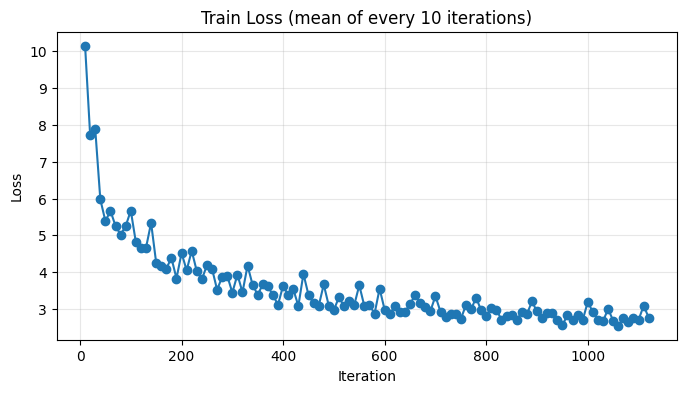

In [ ]:
# Train using generic Trainer (supports MAE 2D/3D and DINO)
logger = TBLogger(log_dir="logs")
trainer = Trainer(model=model, logger=logger, cfg=model_cfg, device=device, plot_loss=True, debug_train=True)
trainer.fit(train_loader, val_loader)


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import torch

# def plot_weights_histogram(model):
#     print("Plotting histograms for model weights...")
#     for name, param in model.named_parameters():
#         if param.requires_grad and param.data is not None:
#             data = param.data.detach().cpu().numpy()
#             # Flatten the data to plot a single histogram
#             data = data.reshape(-1)

#             # Filter out NaN values if any (though unlikely for weights)
#             data = data[~np.isnan(data)]

#             if data.size > 0:
#                 plt.figure(figsize=(8, 5))
#                 plt.hist(data, bins=100, color='skyblue', edgecolor='black')
#                 plt.title(f'Histogram of Weights for: {name}')
#                 plt.xlabel('Weight Value')
#                 plt.ylabel('Frequency')
#                 plt.grid(True)
#                 plt.tight_layout()
#                 plt.show()
#             else:
#                 print(f"Skipping {name}: No valid weight data to plot.")
#         else:
#             print(f"Skipping {name}: Not a trainable parameter or no data.")
#     print("✅ All weight histograms plotted.")

# plot_weights_histogram(model)


Dimensionality is 2D (single frame). Plotting multiple batch items.


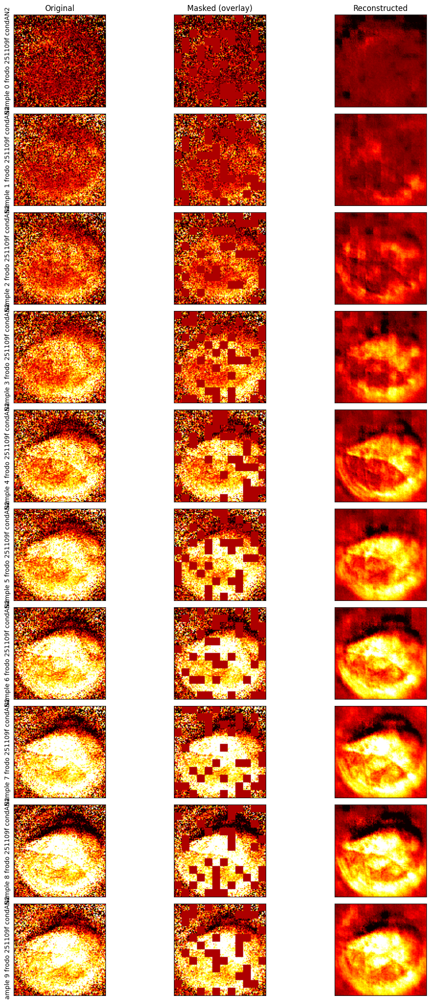

✅ Sequence visualization complete (rows=batch_items, cols=[orig, masked+overlay, recon]).


In [ ]:
from datetime import date
# Sequence visualization: plot Original, Masked(+overlay), Reconstructed vertically over time
import numpy as np
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Define a minimal version
def get_reconstruction(model, batch):
    model.eval()
    with torch.no_grad():
        video_masked = batch["video_masked"]
        video_target = batch["video_target"]
        mask = batch["mask"]
        is_2d = False
        if len(video_target.shape) == 5 and video_target.shape[2] == 1:
            is_2d = True
            video_masked = video_masked.squeeze(2)
            video_target = video_target.squeeze(2)
            if len(mask.shape) == 5:
                mask = mask.squeeze(2)
            if len(mask.shape) == 4 and mask.shape[1] == 1:
                H, W = video_target.shape[2], video_target.shape[3]
                mask = F.interpolate(mask, size=(H, W), mode='nearest')
        features = model.encoder(video_masked)
        if is_2d or len(video_target.shape) == 4:
            target_size = (video_target.shape[2], video_target.shape[3])
            reconstruction = model.decoder(features, target_size=target_size)
        else:
            target_size = (video_target.shape[2], video_target.shape[3], video_target.shape[4])
            reconstruction = model.decoder(features, target_size=target_size)
            if len(mask.shape) == 5 and mask.shape[1] == 1:
                T, H, W = video_target.shape[2], video_target.shape[3], video_target.shape[4]
                mask = F.interpolate(mask, size=(T, H, W), mode='nearest')
        return reconstruction, mask, video_target, video_masked

# Fetch a validation batch and reconstruct
model.eval()
val_sample = next(iter(val_loader))
val_sample = {k: v.to(device) if torch.is_tensor(v) else v
                             for k, v in val_sample.items()}
reconstruction, mask, original, masked = get_reconstruction(model, val_sample)

# Determine dimensionality
# 2D: (B,C,H,W); 3D: (B,C,T,H,W)

if original.ndim == 4:  # 2D case: (B,C,H,W) - plot multiple batch items
    print("Dimensionality is 2D (single frame). Plotting multiple batch items.")
    max_batch_items_to_plot = 10
    num_items = min(original.shape[0], max_batch_items_to_plot)

    # Calculate vmin and vmax using percentiles across all selected batch items for better visualization
    selected_originals_flat = original[:num_items, 0, :, :].cpu().numpy().flatten()
    vmin, vmax = np.percentile(selected_originals_flat, 10), np.percentile(selected_originals_flat, 90)

    fig, axes = plt.subplots(num_items, 3, figsize=(12, 2.2 * num_items))
    if num_items == 1:
        axes = np.array([axes]) # Ensure axes is 2D even for single row

    for b_idx in range(num_items):
        monkey = val_sample['monkey'][b_idx]
        date = val_sample['date'][b_idx]
        condition = val_sample['condition'][b_idx]

        # Original
        axes[b_idx, 0].imshow(original[b_idx, 0].cpu().numpy(), cmap='hot', vmin=vmin, vmax=vmax)
        axes[b_idx, 0].set_ylabel(f"Sample {b_idx} {monkey} {date} {condition}")
        axes[b_idx, 0].set_xticks([]); axes[b_idx, 0].set_yticks([])
        if b_idx == 0:
            axes[b_idx, 0].set_title('Original')

        # Masked + overlay
        masked_frame = masked[b_idx, 0].cpu().numpy()
        mask_frame = mask[b_idx, 0].cpu().numpy()
        # Resize mask if it's smaller than the video frame (happens with pooling)
        if mask_frame.shape != masked_frame.shape:
             mask_frame_tensor = torch.from_numpy(mask_frame).unsqueeze(0).unsqueeze(0) # (1,1,H_mask,W_mask)
             mask_frame = F.interpolate(mask_frame_tensor, size=masked_frame.shape, mode='nearest').squeeze().numpy()
        overlay = np.zeros((*mask_frame.shape, 4), dtype=np.float32) # Use new mask_frame shape
        overlay[..., 0] = 1.0
        overlay[..., 3] = 0.3 * (1.0 - mask_frame)  # red where masked
        axes[b_idx, 1].imshow(masked_frame, cmap='hot', vmin=vmin, vmax=vmax)
        axes[b_idx, 1].imshow(overlay)
        axes[b_idx, 1].set_xticks([]); axes[b_idx, 1].set_yticks([])
        if b_idx == 0:
            axes[b_idx, 1].set_title('Masked (overlay)')

        # Reconstructed
        recon_frame = reconstruction[b_idx, 0].cpu().numpy()
        axes[b_idx, 2].imshow(recon_frame, cmap='hot', vmin=vmin, vmax=vmax)
        axes[b_idx, 2].set_xticks([]); axes[b_idx, 2].set_yticks([])
        if b_idx == 0:
            axes[b_idx, 2].set_title('Reconstructed')

    plt.tight_layout()
    plt.show()
    print("✅ Sequence visualization complete (rows=batch_items, cols=[orig, masked+overlay, recon]).")

else:  # 3D case: (B,C,T,H,W) - plot first batch item over time
    print("Dimensionality is 3D (video). Plotting first batch item over time.")
    b = 0 # Select first item in batch

    # Calculate vmin and vmax using percentiles for better visualization
    original_flat = original[b, 0, :, :, :].cpu().numpy().flatten() # For 3D, original has B,C,T,H,W
    vmin, vmax = np.percentile(original_flat, 10), np.percentile(original_flat, 90)

    T = original.shape[2]
    orig_frames = original[b, 0].cpu()          # (T,H,W)
    masked_frames = masked[b, 0].cpu()          # (T,H,W)
    recon_frames = reconstruction[b, 0].cpu()   # (T,H,W)
    mask_frames = mask[b, 0].cpu()              # (T,H,W) after model fix (assuming get_reconstruction handles resize)

    # Limit number of frames for display
    max_rows = 12
    rows = min(T, max_rows)
    fig, axes = plt.subplots(rows, 3, figsize=(12, 2.2*rows))
    if rows == 1:
        axes = np.array([axes]) # Ensure axes is 2D even for single row

    for t in range(rows):
        # Original
        axes[t, 0].imshow(orig_frames[t].cpu().numpy() if torch.is_tensor(orig_frames[t]) else orig_frames[t], cmap='hot', vmin=vmin, vmax=vmax)
        axes[t, 0].set_ylabel(f"t={t}")
        axes[t, 0].set_xticks([]); axes[t, 0].set_yticks([])
        if t == 0:
            axes[t, 0].set_title('Original')

        # Masked + overlay
        im = axes[t, 1].imshow(masked_frames[t].cpu().numpy() if torch.is_tensor(masked_frames[t]) else masked_frames[t], cmap='hot', vmin=vmin, vmax=vmax)
        m = mask_frames[t].cpu().numpy() if torch.is_tensor(mask_frames[t]) else mask_frames[t]
        # Check if mask_frame needs interpolation (e.g., if mask is patch-based and smaller than image)
        if m.shape != masked_frames[t].shape:
            m_tensor = torch.from_numpy(m).unsqueeze(0).unsqueeze(0) # (1,1,H_mask,W_mask)
            m = F.interpolate(m_tensor, size=masked_frames[t].shape, mode='nearest').squeeze().numpy()
        overlay = np.zeros((m.shape[0], m.shape[1], 4), dtype=np.float32) # Use new m shape
        overlay[..., 0] = 1.0
        overlay[..., 3] = 0.3 * (1.0 - m)  # red where masked
        axes[t, 1].imshow(overlay)
        axes[t, 1].set_xticks([]); axes[t, 1].set_yticks([])
        if t == 0:
            axes[t, 1].set_title('Masked (overlay)')

        # Reconstructed
        axes[t, 2].imshow(recon_frames[t].cpu().numpy() if torch.is_tensor(recon_frames[t]) else recon_frames[t], cmap='hot', vmin=vmin, vmax=vmax)
        axes[t, 2].set_xticks([]); axes[t, 2].set_yticks([])
        if t == 0:
            axes[t, 2].set_title('Reconstructed')

    plt.tight_layout()
    plt.show()
    print("✅ Sequence visualization complete (rows=time, cols=[orig, masked+overlay, recon]).")

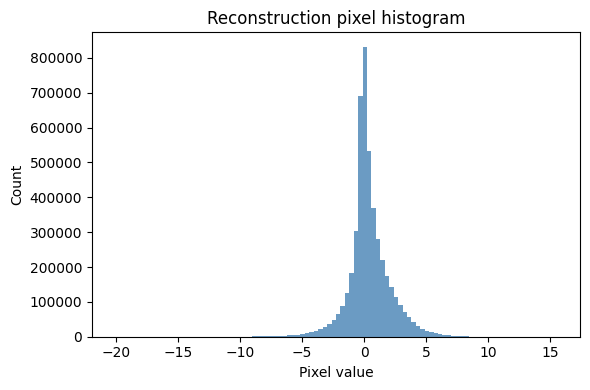

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

def plot_recon_hist(recon_frames, bins=100, title="Reconstruction pixel histogram"):
    # Move tensor to CPU and flatten
    if torch.is_tensor(recon_frames):
        data = recon_frames.detach().cpu().numpy()
    else:
        data = np.asarray(recon_frames)

    data = data.reshape(-1)

    plt.figure(figsize=(6, 4))
    plt.hist(data, bins=bins, color="steelblue", alpha=0.8)
    plt.title(title)
    plt.xlabel("Pixel value")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

plot_recon_hist(reconstruction)

### Check on test set

Dimensionality is 2D (single frame). Plotting multiple batch items.


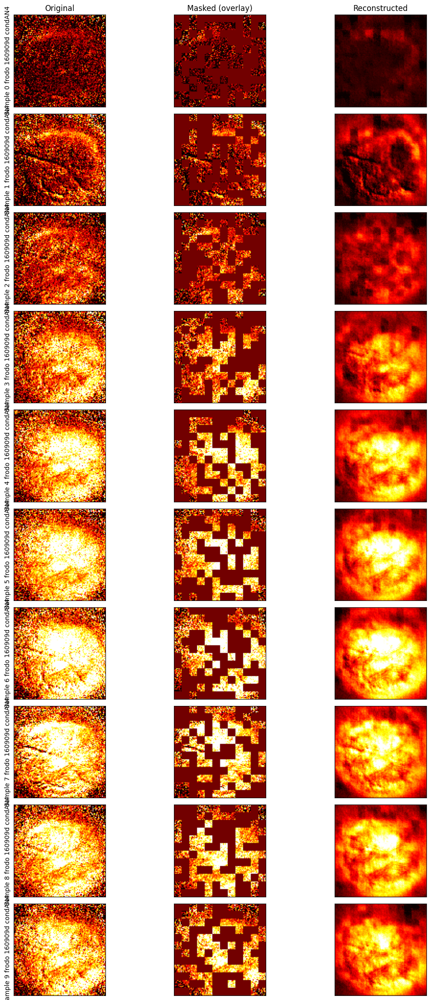

✅ Sequence visualization complete (rows=batch_items, cols=[orig, masked+overlay, recon]).


In [ ]:
# Fetch a validation batch and reconstruct
model.eval()
tst_sample = next(iter(test_loader))
tst_sample = {k: v.to(device) if torch.is_tensor(v) else v
                             for k, v in tst_sample.items()}
reconstruction, mask, original, masked = get_reconstruction(model, tst_sample)

# Determine dimensionality
# 2D: (B,C,H,W); 3D: (B,C,T,H,W)

if original.ndim == 4:  # 2D case: (B,C,H,W) - plot multiple batch items
    print("Dimensionality is 2D (single frame). Plotting multiple batch items.")
    max_batch_items_to_plot = 10
    num_items = min(original.shape[0], max_batch_items_to_plot)

    # Calculate vmin and vmax using percentiles across all selected batch items for better visualization
    selected_originals_flat = original[:num_items, 0, :, :].cpu().numpy().flatten()
    vmin, vmax = np.percentile(selected_originals_flat, 10), np.percentile(selected_originals_flat, 90)

    fig, axes = plt.subplots(num_items, 3, figsize=(12, 2.2 * num_items))
    if num_items == 1:
        axes = np.array([axes]) # Ensure axes is 2D even for single row

    for b_idx in range(num_items):
        monkey = tst_sample['monkey'][b_idx]
        date = tst_sample['date'][b_idx]
        condition = tst_sample['condition'][b_idx]

        # Original
        axes[b_idx, 0].imshow(original[b_idx, 0].cpu().numpy(), cmap='hot', vmin=vmin, vmax=vmax)
        axes[b_idx, 0].set_ylabel(f"Sample {b_idx} {monkey} {date} {condition}")
        axes[b_idx, 0].set_xticks([]); axes[b_idx, 0].set_yticks([])
        if b_idx == 0:
            axes[b_idx, 0].set_title('Original')

        # Masked + overlay
        masked_frame = masked[b_idx, 0].cpu().numpy()
        mask_frame = mask[b_idx, 0].cpu().numpy()
        # Resize mask if it's smaller than the video frame (happens with pooling)
        if mask_frame.shape != masked_frame.shape:
             mask_frame_tensor = torch.from_numpy(mask_frame).unsqueeze(0).unsqueeze(0) # (1,1,H_mask,W_mask)
             mask_frame = F.interpolate(mask_frame_tensor, size=masked_frame.shape, mode='nearest').squeeze().numpy()
        overlay = np.zeros((*mask_frame.shape, 4), dtype=np.float32) # Use new mask_frame shape
        overlay[..., 0] = 1.0
        overlay[..., 3] = 0.3 * (1.0 - mask_frame)  # red where masked
        axes[b_idx, 1].imshow(masked_frame, cmap='hot', vmin=vmin, vmax=vmax)
        axes[b_idx, 1].imshow(overlay)
        axes[b_idx, 1].set_xticks([]); axes[b_idx, 1].set_yticks([])
        if b_idx == 0:
            axes[b_idx, 1].set_title('Masked (overlay)')

        # Reconstructed
        recon_frame = reconstruction[b_idx, 0].cpu().numpy()
        axes[b_idx, 2].imshow(recon_frame, cmap='hot', vmin=vmin, vmax=vmax)
        axes[b_idx, 2].set_xticks([]); axes[b_idx, 2].set_yticks([])
        if b_idx == 0:
            axes[b_idx, 2].set_title('Reconstructed')

    plt.tight_layout()
    plt.show()
    print("✅ Sequence visualization complete (rows=batch_items, cols=[orig, masked+overlay, recon]).")

else:  # 3D case: (B,C,T,H,W) - plot first batch item over time
    print("Dimensionality is 3D (video). Plotting first batch item over time.")
    b = 0 # Select first item in batch

    # Calculate vmin and vmax using percentiles for better visualization
    original_flat = original[b, 0, :, :, :].cpu().numpy().flatten() # For 3D, original has B,C,T,H,W
    vmin, vmax = np.percentile(original_flat, 10), np.percentile(original_flat, 90)

    T = original.shape[2]
    orig_frames = original[b, 0].cpu()          # (T,H,W)
    masked_frames = masked[b, 0].cpu()          # (T,H,W)
    recon_frames = reconstruction[b, 0].cpu()   # (T,H,W)
    mask_frames = mask[b, 0].cpu()              # (T,H,W) after model fix (assuming get_reconstruction handles resize)

    # Limit number of frames for display
    max_rows = 12
    rows = min(T, max_rows)
    fig, axes = plt.subplots(rows, 3, figsize=(12, 2.2*rows))
    if rows == 1:
        axes = np.array([axes]) # Ensure axes is 2D even for single row

    for t in range(rows):
        # Original
        axes[t, 0].imshow(orig_frames[t].cpu().numpy() if torch.is_tensor(orig_frames[t]) else orig_frames[t], cmap='hot', vmin=vmin, vmax=vmax)
        axes[t, 0].set_ylabel(f"t={t}")
        axes[t, 0].set_xticks([]); axes[t, 0].set_yticks([])
        if t == 0:
            axes[t, 0].set_title('Original')

        # Masked + overlay
        im = axes[t, 1].imshow(masked_frames[t].cpu().numpy() if torch.is_tensor(masked_frames[t]) else masked_frames[t], cmap='hot', vmin=vmin, vmax=vmax)
        m = mask_frames[t].cpu().numpy() if torch.is_tensor(mask_frames[t]) else mask_frames[t]
        # Check if mask_frame needs interpolation (e.g., if mask is patch-based and smaller than image)
        if m.shape != masked_frames[t].shape:
            m_tensor = torch.from_numpy(m).unsqueeze(0).unsqueeze(0) # (1,1,H_mask,W_mask)
            m = F.interpolate(m_tensor, size=masked_frames[t].shape, mode='nearest').squeeze().numpy()
        overlay = np.zeros((m.shape[0], m.shape[1], 4), dtype=np.float32) # Use new m shape
        overlay[..., 0] = 1.0
        overlay[..., 3] = 0.3 * (1.0 - m)  # red where masked
        axes[t, 1].imshow(overlay)
        axes[t, 1].set_xticks([]); axes[t, 1].set_yticks([])
        if t == 0:
            axes[t, 1].set_title('Masked (overlay)')

        # Reconstructed
        axes[t, 2].imshow(recon_frames[t].cpu().numpy() if torch.is_tensor(recon_frames[t]) else recon_frames[t], cmap='hot', vmin=vmin, vmax=vmax)
        axes[t, 2].set_xticks([]); axes[t, 2].set_yticks([])
        if t == 0:
            axes[t, 2].set_title('Reconstructed')

    plt.tight_layout()
    plt.show()